In [23]:
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
%matplotlib inline

In [24]:
df = pd.read_csv('../../data/kc_house_data.csv')

In [25]:
df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.0,3,1.00,1180,5650,1.0,NaN,NONE,...,7 Average,1180,0.0,1955,0.0,98178,47.5112,-122.257,1340,5650
1,6414100192,12/9/2014,538000.0,3,2.25,2570,7242,2.0,NO,NONE,...,7 Average,2170,400.0,1951,1991.0,98125,47.7210,-122.319,1690,7639
2,5631500400,2/25/2015,180000.0,2,1.00,770,10000,1.0,NO,NONE,...,6 Low Average,770,0.0,1933,NaN,98028,47.7379,-122.233,2720,8062
3,2487200875,12/9/2014,604000.0,4,3.00,1960,5000,1.0,NO,NONE,...,7 Average,1050,910.0,1965,0.0,98136,47.5208,-122.393,1360,5000
4,1954400510,2/18/2015,510000.0,3,2.00,1680,8080,1.0,NO,NONE,...,8 Good,1680,0.0,1987,0.0,98074,47.6168,-122.045,1800,7503


In [26]:
# Below code unnecessary 
# df['geometry'] = list(zip(df.lat, df.long))

In [27]:
gdf = gpd.GeoDataFrame(
    df, geometry=gpd.points_from_xy(df.long, df.lat))

In [28]:
gdf.crs

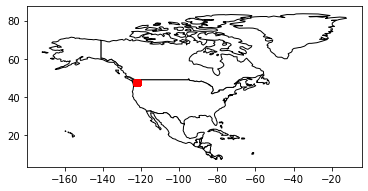

In [29]:
#QUICK TEST PLOT 

world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

# We restrict to North America.
ax = world[world.continent == 'North America'].plot(
    color='white', edgecolor='black')

# We can now plot our ``GeoDataFrame``.
gdf.plot(ax=ax, color='red')

plt.show()

In [30]:
gdf.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,geometry
0,7129300520,10/13/2014,221900.0,3,1.00,1180,5650,1.0,NaN,NONE,...,1180,0.0,1955,0.0,98178,47.5112,-122.257,1340,5650,POINT (-122.25700 47.51120)
1,6414100192,12/9/2014,538000.0,3,2.25,2570,7242,2.0,NO,NONE,...,2170,400.0,1951,1991.0,98125,47.7210,-122.319,1690,7639,POINT (-122.31900 47.72100)
2,5631500400,2/25/2015,180000.0,2,1.00,770,10000,1.0,NO,NONE,...,770,0.0,1933,NaN,98028,47.7379,-122.233,2720,8062,POINT (-122.23300 47.73790)
3,2487200875,12/9/2014,604000.0,4,3.00,1960,5000,1.0,NO,NONE,...,1050,910.0,1965,0.0,98136,47.5208,-122.393,1360,5000,POINT (-122.39300 47.52080)
4,1954400510,2/18/2015,510000.0,3,2.00,1680,8080,1.0,NO,NONE,...,1680,0.0,1987,0.0,98074,47.6168,-122.045,1800,7503,POINT (-122.04500 47.61680)


In [76]:
police_gdf = gpd.read_file('GIS_data/Police_Station_Locations_in_King_County___kcp_loc_point.shp')
police_gdf.head()

,OBJECTID,FEATURE_ID,ESITE,CODE,NAME,ABB_NAME,ADDRESS,ZIPCODE,CITY,STATE_NAME,PHONE,DISTRICT,FAC_CLASS,NEWSTA,RESOLUTION,WEBSITE,PIN,MAJOR,MINOR,geometry
0,1,650070,419120,65,WSP District 2 Seattle North Detachment,WSP District 2 Seattle N Detatch,811 E Roanoke,98102,Seattle,WA,(206) 720-3040,SE,0,X,placed manually (bldg. believed to be next to ...,http://www.wsp.wa.gov/traveler/d2detach.htm,5535100285,553510,0285,POINT (-122.32153 47.64298)
1,2,650016,500461,65,White Center Storefront,White Center,1327 SW 102nd St,98146,Unincorporated King County,WA,(206) 477-1237,SE,6,X,unsure of location/QC- address matches parcel ...,http://www.kingcounty.gov/depts/sheriff/police...,7973202900,797320,2900,POINT (-122.35535 47.51703)
2,3,650084,764142,65,KC Airport Law Enforcement,KC Airport Law Enforcement,7277 Perimeter Rd S,98108,Seattle,WA,(206) 296-7392,KC,0,Y,added 9/04,http://www.kingcounty.gov/depts/sheriff/police...,2824049007,282404,9007,POINT (-122.30414 47.53738)
3,4,650008,611396,65,Fairwood Storefront,Fairwood,17620 140th Ave SE,98058,Unincorporated King County,WA,(206) 477-1243,RN,6,X,QC- address from 17240 140th Ave,http://www.kingcounty.gov/depts/sheriff/police...,7560800010,756080,0010,POINT (-122.15196 47.44443)
4,5,650001,620199,65,KC Precinct 3 Headquarters,KC Precinct 3 HQ,22300 SE 231st St,98038,Maple Valley,WA,(206) 477-6446,MV,1,E,"moved slightly to current location/QC, added n...",http://www.kingcounty.gov/depts/sheriff/police...,1622069143,162206,9143,POINT (-122.04414 47.39509)


In [32]:
gdf.crs = "EPSG:4326"

In [33]:
gdf.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [34]:
import folium

In [35]:
x = 0



In [36]:
### Mapping out police stations (blue) compared to house locations (white) 

m = folium.Map([47.452936, -121.850514], tiles='CartoDb dark_matter')

locs_police = [(x,y) for x,y in zip(police_gdf['geometry'].y, police_gdf['geometry'].x)]

locs_houses = [(x,y) for x,y in zip(gdf['geometry'].y, gdf['geometry'].x)]


for location in locs_houses:
    folium.CircleMarker(location = location, color = 'white', radius = .5).add_to(m)

for location in locs_police:
    folium.CircleMarker(location = location, color='blue', radius=4 ).add_to(m)
    

m

In [37]:
from scipy.spatial import cKDTree
from shapely.geometry import Point

In [38]:
def ckdnearest(gdA, gdB, name):
    
    nA = np.array(list(gdA.geometry.apply(lambda x: (x.x, x.y))))
    nB = np.array(list(gdB.geometry.apply(lambda x: (x.x, x.y))))
    btree = cKDTree(nB)
    
    dist, idx = btree.query(nA, k=1)
    
    gdB_nearest = gdB.iloc[idx].drop(columns='geometry').reset_index(drop=True)
    gdf = pd.concat(
        [
            gdA.reset_index(drop=True),
            gdB_nearest[name],
            pd.Series(dist, name='dist')
        ],
        axis = 1)
    
    return gdf

In [62]:
#get nearest geometry
police_updated_gdf = ckdnearest(gdf, police_gdf, 'NAME')

In [86]:
police_updated_gdf = police_updated_gdf.rename(columns={"dist": "police_station_dist", "NAME": "Police_Station_NAME"})

In [91]:

medical_gdf = gpd.read_file('GIS_data/Medical_Facilities_including_Hospitals___medical_facilities_point.shp')

medical_updated_gdf = ckdnearest(gdf, medical_gdf, 'NAME')


In [92]:
medical_updated_gdf = medical_updated_gdf.rename(columns={'dist': 'medical_dist', 'NAME': 'medical_name'})
medical_updated_gdf

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,zipcode,lat,long,sqft_living15,sqft_lot15,geometry,police_dist,police_station_name,medical_name,medical_dist
0,7129300520,10/13/2014,221900.0,3,1.00,1180,5650,1.0,NaN,NONE,...,98178,47.5112,-122.257,1340,5650,POINT (-122.25700 47.51120),0.027330,West Hill Storefront,Highline Medical Center Speciality Campus,0.045415
1,6414100192,12/9/2014,538000.0,3,2.25,2570,7242,2.0,NO,NONE,...,98125,47.7210,-122.319,1690,7639,POINT (-122.31900 47.72100),0.023986,Seattle Police North Precinct,Kindred Hospital Seattle - Northgate,0.014602
2,5631500400,2/25/2015,180000.0,2,1.00,770,10000,1.0,NO,NONE,...,98028,47.7379,-122.233,2720,8062,POINT (-122.23300 47.73790),0.027925,Kenmore Police Department,Fairfax Hospital,0.034020
3,2487200875,12/9/2014,604000.0,4,3.00,1960,5000,1.0,NO,NONE,...,98136,47.5208,-122.393,1360,5000,POINT (-122.39300 47.52080),0.034575,Seattle Police Southwest Precinct,Navos Mental Health Solutions,0.029929
4,1954400510,2/18/2015,510000.0,3,2.00,1680,8080,1.0,NO,NONE,...,98074,47.6168,-122.045,1800,7503,POINT (-122.04500 47.61680),0.017513,Sammamish Police Department,Swedish Pine Lake Primary Care,0.034583
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21592,263000018,5/21/2014,360000.0,3,2.50,1530,1131,3.0,NO,NONE,...,98103,47.6993,-122.346,1530,1509,POINT (-122.34600 47.69930),0.011794,Seattle Police North Precinct,Blood Bank-Northend,0.006702
21593,6600060120,2/23/2015,400000.0,4,2.50,2310,5813,2.0,NO,NONE,...,98146,47.5107,-122.362,1830,7200,POINT (-122.36200 47.51070),0.009180,White Center Storefront,HealthPoint Evergreen Campus,0.019534
21594,1523300141,6/23/2014,402101.0,2,0.75,1020,1350,2.0,NO,NONE,...,98144,47.5944,-122.299,1020,2007,POINT (-122.29900 47.59440),0.024286,Metro Transit Police Unit,Carolyn Downs Family Medical Center,0.008943
21595,291310100,1/16/2015,400000.0,3,2.50,1600,2388,2.0,NaN,NONE,...,98027,47.5345,-122.069,1410,1287,POINT (-122.06900 47.53450),0.035043,Issaquah Police Department,UW Clinic Issaquah,0.019487


In [69]:

schools_gdf = gpd.read_file('GIS_data/School_Sites_in_King_County___schsite_point.shp')
schools_gdf['FEATUREDES'].value_counts()

School-Elementary               345
School-Junior High/Middle        80
School-High                      73
School-Alternative               64
School-Other Facility            32
School-College or University     31
School-K-12                      17
Name: FEATUREDES, dtype: int64

In [77]:
schools_gdf.head()

,OBJECTID,FEATURE_ID,ESITE,CODE,NAME,ABB_NAME,ADDRESS,ZIPCODE,LONG_CEN,LAT_CEN,SCH_CLASS,DISTRICT,PIN,MAJOR,MINOR,FEATUREDES,OSPI_CODE,geometry
0,1,207,80,662,Sammamish High School,Sammamish,100 140th Ave SE,98005,-122.152305,47.608458,10.0,BELLEVUE,3425059019,342505,9019,School-High,3282.0,POINT (-122.15230 47.60846)
1,2,263,113,660,Saint Brendan Catholic School,Saint Brendan,10049 NE 195th St,98011,-122.205416,47.768905,20.0,NORTHSHORE,0526059084,052605,9084,School-Elementary,0.0,POINT (-122.20541 47.76891)
2,3,884,527409,660,Highland Park Elementary School,Highland Park,1012 SW Trenton St,98106,-122.348456,47.525263,10.0,SEATTLE,7972603210,797260,3210,School-Elementary,2269.0,POINT (-122.34845 47.52527)
3,4,475,8634,660,Lakeview Elementary School,Lakeview,10400 NE 68th St,98033,-122.200171,47.667242,10.0,LAKE WASHINGTON,7882600132,788260,0132,School-Elementary,3041.0,POINT (-122.20017 47.66724)
4,5,1093,12282,662,Nathan Hale High School,Nathan Hale,10750 30th Ave NE,98125,-122.294728,47.708040,10.0,SEATTLE,2826049152,282604,9152,School-High,3479.0,POINT (-122.29473 47.70804)


In [70]:
elementary_gdf= schools_gdf[schools_gdf['FEATUREDES'] == 'School-Elementary']
middle_gdf = schools_gdf[schools_gdf['FEATUREDES'] == 'School-Junior High/Middle']
high_gdf = schools_gdf[schools_gdf['FEATUREDES'] == 'School-High']


In [75]:
schools_updated_gdf = ckdnearest(gdf,schools_gdf, 'NAME')
schools_updated_gdf = schools_updated_gdf.rename(columns={"dist": "school_dist", "NAME": "school_NAME"})
schools_updated_gdf['school_dist'].describe()

count    21597.000000
mean         0.008650
std          0.008436
min          0.000095
25%          0.004333
50%          0.006740
75%          0.010209
max          0.325079
Name: school_dist, dtype: float64

In [78]:


farm_markets_gdf = gpd.read_file('GIS_data/Farmers_Markets_in_King_County___farmers_markets_point.shp')
farm_markets_gdf.head()

,OBJECTID,FEATURE_ID,ESITE,CODE,NAME,ABB_NAME,ADDRESS,ZIPCODE,CITY,LOCATION,WEBSITE,COUNTYNAME,START_DATE,END_DATE,DAYOFWEEK,STARTTIME,ENDTIME,CRDITDEBIT,EBTFDSTAMP,geometry
0,1,903044,0,903,Lake Forest Park Farmers Market,Lake Forest Park Farmers Market,17171 Bothell Way NE,91855,Lake Forest Park,17171 Bothell Way NE,https://www.thirdplacecommons.org,King,2020-05-10,2020-10-25,Sundays,10AM,3PM,FALSE,TRUE,POINT (-122.27900 47.75290)
1,2,903051,0,903,Kirkland Wednesday Market,Kirkland Wednesday Market,111 Park Lane,98033,Kirkland,Park Lane between Lake & Main Street,http://www.kirklandmarket.org/,King,2020-06-03,2020-09-23,Wednesdays,2PM,7PM,TRUE,TRUE,POINT (-122.20600 47.67590)
2,3,903061,0,903,Issaquah Farmers Market,Issaquah Farmers Market,1730 10th Ave. N.W.,98027,Issaquah,1730 10th Ave NW,https://www.issaquahwa.gov/index.aspx?nid=778,King,2020-06-06,2020-09-26,Saturdays,9AM,2PM,TRUE,FALSE,POINT (-122.04956 47.55018)
3,4,10000051,1231461,903,Tukwila Village Farmers Market,Tukwila Village Farmers Market,14350 Tukwila International Blvd,98168,Tukwila,14350 Tukwila International Blvd,https://www.foodinnovationnetwork.org/markets,King,2020-06-04,2020-10-15,Wednesdays,4PM,7PM,FALSE,FALSE,POINT (-122.28309 47.47448)
4,5,903074,0,903,Duvall Farmers Market,Duvall Farmers Market,"Taylor Landing, N of Bridge into downtown Duva...",98019,Duvall,"Taylor Landing, N of Bridge into downtown Duva...",http://www.duvallfarmersmarket.org,King,2020-05-07,2020-10-08,Thursdays,3PM,7PM,TRUE,TRUE,POINT (-121.98683 47.74428)


In [84]:
farm_markets_updated_gdf = ckdnearest(gdf,farm_markets_gdf, 'NAME')
farm_markets_updated_gdf = farm_markets_updated_gdf.rename(columns={"dist": "farm_market_dist", "NAME": "farm_market_NAME"})
farm_markets_updated_gdf.describe()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,sqft_above,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,farm_market_dist
count,2.159700e+04,2.159700e+04,21597.000000,21597.000000,21597.000000,2.159700e+04,21597.000000,21597.000000,21597.000000,17755.000000,21597.000000,21597.000000,21597.000000,21597.000000,21597.000000,21597.000000
mean,4.580474e+09,5.402966e+05,3.373200,2.115826,2080.321850,1.509941e+04,1.494096,1788.596842,1970.999676,83.636778,98077.951845,47.560093,-122.213982,1986.620318,12758.283512,0.034153
std,2.876736e+09,3.673681e+05,0.926299,0.768984,918.106125,4.141264e+04,0.539683,827.759761,29.375234,399.946414,53.513072,0.138552,0.140724,685.230472,27274.441950,0.025022
min,1.000102e+06,7.800000e+04,1.000000,0.500000,370.000000,5.200000e+02,1.000000,370.000000,1900.000000,0.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000,0.000199
25%,2.123049e+09,3.220000e+05,3.000000,1.750000,1430.000000,5.040000e+03,1.000000,1190.000000,1951.000000,0.000000,98033.000000,47.471100,-122.328000,1490.000000,5100.000000,0.017622
50%,3.904930e+09,4.500000e+05,3.000000,2.250000,1910.000000,7.618000e+03,1.500000,1560.000000,1975.000000,0.000000,98065.000000,47.571800,-122.231000,1840.000000,7620.000000,0.028935
75%,7.308900e+09,6.450000e+05,4.000000,2.500000,2550.000000,1.068500e+04,2.000000,2210.000000,1997.000000,0.000000,98118.000000,47.678000,-122.125000,2360.000000,10083.000000,0.045282
max,9.900000e+09,7.700000e+06,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,9410.000000,2015.000000,2015.000000,98199.000000,47.777600,-121.315000,6210.000000,871200.000000,0.519270


In [93]:
gdf['police_dist'] = police_updated_gdf['police_station_dist']
gdf['police_station_name'] = police_updated_gdf['Police_Station_NAME']
gdf['medical_dist'] = medical_updated_gdf['medical_dist']
gdf['medical_name'] = medical_updated_gdf['medical_name']
gdf['school_dist'] = schools_updated_gdf['school_dist']
gdf['school_name'] = schools_updated_gdf['school_NAME']
gdf['farmers_market_dist'] = farm_markets_updated_gdf['farm_market_dist']
gdf['farmers_market_name'] = farm_markets_updated_gdf['farm_market_NAME']
gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 30 columns):
 #   Column               Non-Null Count  Dtype   
---  ------               --------------  -----   
 0   id                   21597 non-null  int64   
 1   date                 21597 non-null  object  
 2   price                21597 non-null  float64 
 3   bedrooms             21597 non-null  int64   
 4   bathrooms            21597 non-null  float64 
 5   sqft_living          21597 non-null  int64   
 6   sqft_lot             21597 non-null  int64   
 7   floors               21597 non-null  float64 
 8   waterfront           19221 non-null  object  
 9   view                 21534 non-null  object  
 10  condition            21597 non-null  object  
 11  grade                21597 non-null  object  
 12  sqft_above           21597 non-null  int64   
 13  sqft_basement        21597 non-null  object  
 14  yr_built             21597 non-null  int64   
 15  yr_renovate

In [94]:
gdf.to_csv('data/kc_house_data_with_distances.csv')